In [3]:
from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

BASE_DIR = Path(".")
# If running this notebook from another folder, update DATA_DIR to your CSV location.
DATA_DIR = Path("/Users/nischayaggarwal/Internship 1/data/Processed")
CHART_DIR = Path("/Users/nischayaggarwal/Internship 1/reports")
CHART_DIR.mkdir(parents=True, exist_ok=True)

plt.rcParams["figure.figsize"] = (12, 6)
sns.set_theme(style="whitegrid")

def save_matplotlib(name):
    path = CHART_DIR / name
    plt.tight_layout()
    plt.savefig(path, dpi=300, bbox_inches="tight")
    print(f"Saved: {path}")

def save_plotly(fig, name):
    '''
    Saves Plotly chart as HTML always.
    Saves PNG if kaleido is installed.
    In VS Code/Jupyter, HTML export is always reliable.
    '''
    html_path = CHART_DIR / name.replace(".png", ".html")
    fig.write_html(html_path)
    try:
        png_path = CHART_DIR / name
        fig.write_image(str(png_path), scale=2)
        print(f"Saved: {png_path}")
    except Exception as e:
        print(f"PNG export skipped for {name}. Install kaleido using: pip install -U kaleido")
        print(f"HTML saved instead: {html_path}")

In [4]:
fund_master = pd.read_csv(DATA_DIR / "clean_fund_master.csv")
nav = pd.read_csv(DATA_DIR / "clean_nav_history.csv")
aum = pd.read_csv(DATA_DIR / "clean_aum_by_fund_house.csv")
sip = pd.read_csv(DATA_DIR / "clean_monthly_sip_inflows.csv")
category_inflows = pd.read_csv(DATA_DIR / "clean_category_inflows.csv")
folio = pd.read_csv(DATA_DIR / "clean_industry_folio_count.csv")
transactions = pd.read_csv(DATA_DIR / "clean_investor_transactions.csv")
portfolio = pd.read_csv(DATA_DIR / "clean_portfolio_holdings.csv")
benchmark = pd.read_csv(DATA_DIR / "clean_benchmark_indices.csv")

# Date parsing
nav["date"] = pd.to_datetime(nav["date"])
aum["date"] = pd.to_datetime(aum["date"])
transactions["date"] = pd.to_datetime(transactions["date"])
benchmark["date"] = pd.to_datetime(benchmark["date"])
portfolio["portfolio_date"] = pd.to_datetime(portfolio["portfolio_date"], errors="coerce")

sip["month"] = pd.to_datetime(sip["month"].astype(str))
category_inflows["month"] = pd.to_datetime(category_inflows["month"].astype(str))
folio["month"] = pd.to_datetime(folio["month"].astype(str))

print("Loaded datasets:")
for name, df in {
    "fund_master": fund_master,
    "nav": nav,
    "aum": aum,
    "sip": sip,
    "category_inflows": category_inflows,
    "folio": folio,
    "transactions": transactions,
    "portfolio": portfolio,
    "benchmark": benchmark,
}.items():
    print(f"{name:20s} {df.shape}")

Loaded datasets:
fund_master          (40, 15)
nav                  (46000, 3)
aum                  (90, 5)
sip                  (48, 6)
category_inflows     (144, 3)
folio                (21, 6)
transactions         (32778, 14)
portfolio            (322, 8)
benchmark            (8050, 3)


In [5]:
nav = nav.merge(
    fund_master[["amfi_code", "fund_house", "scheme_name", "category", "sub_category", "risk_category"]],
    on="amfi_code",
    how="left"
)

transactions = transactions.merge(
    fund_master[["amfi_code", "fund_house", "scheme_name", "category", "sub_category", "risk_category"]],
    on="amfi_code",
    how="left"
)

nav.head()

,amfi_code,date,nav,fund_house,scheme_name,category,sub_category,risk_category
0,100016,2022-01-03,520.4608,HDFC Mutual Fund,HDFC Top 100 Fund - Regular Plan - Growth,Equity,Large Cap,Moderate
1,100016,2022-01-04,515.0971,HDFC Mutual Fund,HDFC Top 100 Fund - Regular Plan - Growth,Equity,Large Cap,Moderate
2,100016,2022-01-05,521.7239,HDFC Mutual Fund,HDFC Top 100 Fund - Regular Plan - Growth,Equity,Large Cap,Moderate
3,100016,2022-01-06,515.7880,HDFC Mutual Fund,HDFC Top 100 Fund - Regular Plan - Growth,Equity,Large Cap,Moderate
4,100016,2022-01-07,515.1639,HDFC Mutual Fund,HDFC Top 100 Fund - Regular Plan - Growth,Equity,Large Cap,Moderate


In [6]:
# =========================
# Chart 1: NAV trend for all schemes
# =========================
fig = px.line(
    nav.sort_values("date"),
    x="date",
    y="nav",
    color="scheme_name",
    hover_data=["amfi_code", "fund_house", "category", "sub_category"],
    title="Daily NAV Trend for All 40 Mutual Fund Schemes (2022–2026)"
)

# Highlight 2023 bull run
fig.add_vrect(
    x0="2023-01-01", x1="2023-12-31",
    fillcolor="green", opacity=0.08,
    layer="below", line_width=0,
    annotation_text="2023 Bull Run",
    annotation_position="top left"
)

# Highlight 2024 correction period
fig.add_vrect(
    x0="2024-01-01", x1="2024-06-30",
    fillcolor="red", opacity=0.08,
    layer="below", line_width=0,
    annotation_text="2024 Market Correction",
    annotation_position="top left"
)

fig.update_layout(
    height=750,
    xaxis_title="Date",
    yaxis_title="NAV (₹)",
    legend_title="Scheme",
    hovermode="x unified"
)

fig.show()
save_plotly(fig, "01_nav_trend_all_schemes.png")

PNG export skipped for 01_nav_trend_all_schemes.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/01_nav_trend_all_schemes.html


In [7]:
# =========================
# Chart 2: Normalized NAV comparison
# =========================
nav_norm = nav.sort_values(["amfi_code", "date"]).copy()
nav_norm["base_nav"] = nav_norm.groupby("amfi_code")["nav"].transform("first")
nav_norm["normalized_nav_100"] = (nav_norm["nav"] / nav_norm["base_nav"]) * 100

fig = px.line(
    nav_norm,
    x="date",
    y="normalized_nav_100",
    color="scheme_name",
    title="Normalized NAV Trend: Base = 100 at First Available Date",
    hover_data=["amfi_code", "fund_house", "sub_category"]
)

fig.add_vrect(x0="2023-01-01", x1="2023-12-31", fillcolor="green", opacity=0.08, layer="below", line_width=0)
fig.add_vrect(x0="2024-01-01", x1="2024-06-30", fillcolor="red", opacity=0.08, layer="below", line_width=0)

fig.update_layout(height=750, xaxis_title="Date", yaxis_title="Normalized NAV Index")
fig.show()
save_plotly(fig, "02_normalized_nav_trend.png")

PNG export skipped for 02_normalized_nav_trend.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/02_normalized_nav_trend.html


Saved: /Users/nischayaggarwal/Internship 1/reports/03_aum_growth_by_fund_house.png


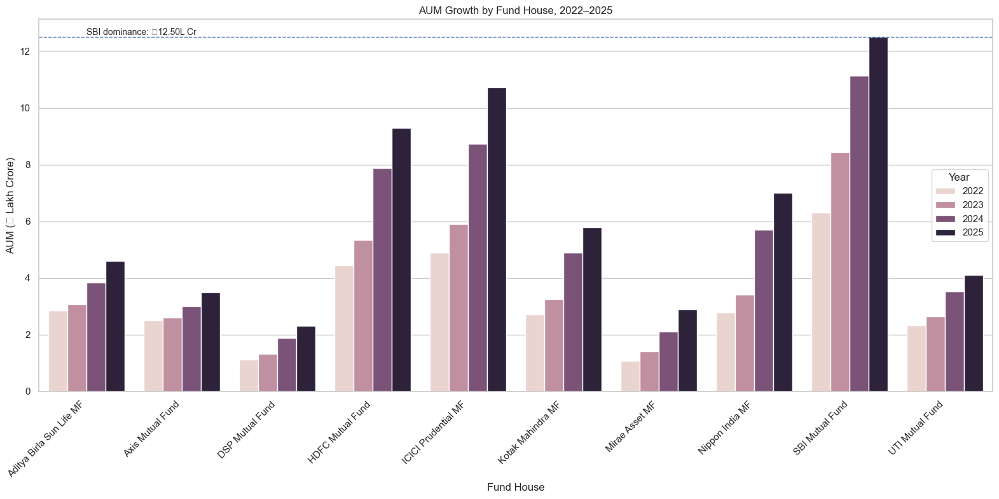

In [8]:
# =========================
# Chart 3: AUM grouped bar by fund house and year
# =========================
aum_yearly = (
    aum.assign(year=aum["date"].dt.year)
       .groupby(["year", "fund_house"], as_index=False)
       .agg(aum_lakh_crore=("aum_lakh_crore", "max"),
            aum_crore=("aum_crore", "max"),
            num_schemes=("num_schemes", "max"))
)

plt.figure(figsize=(16, 8))
sns.barplot(
    data=aum_yearly,
    x="fund_house",
    y="aum_lakh_crore",
    hue="year"
)
plt.title("AUM Growth by Fund House, 2022–2025")
plt.xlabel("Fund House")
plt.ylabel("AUM (₹ Lakh Crore)")
plt.xticks(rotation=45, ha="right")

# Highlight SBI's dominance around ₹12.5 lakh crore
sbi_data = aum_yearly[aum_yearly["fund_house"].str.contains("SBI", case=False, na=False)]
if not sbi_data.empty:
    sbi_max = sbi_data.loc[sbi_data["aum_lakh_crore"].idxmax()]
    plt.axhline(sbi_max["aum_lakh_crore"], linestyle="--", linewidth=1)
    plt.text(
        0, sbi_max["aum_lakh_crore"],
        f"SBI dominance: ₹{sbi_max['aum_lakh_crore']:.2f}L Cr",
        va="bottom", fontsize=10
    )

plt.legend(title="Year")
save_matplotlib("03_aum_growth_by_fund_house.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/04_latest_aum_by_fund_house.png


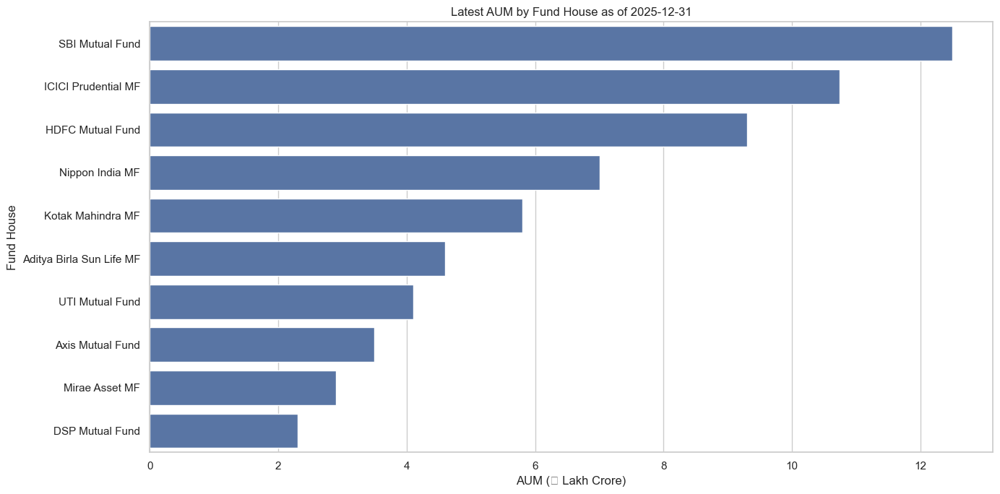

In [9]:
# =========================
# Chart 4: Latest AUM by fund house
# =========================
latest_aum_date = aum["date"].max()
latest_aum = (
    aum[aum["date"] == latest_aum_date]
    .sort_values("aum_lakh_crore", ascending=False)
)

plt.figure(figsize=(14, 7))
sns.barplot(
    data=latest_aum,
    y="fund_house",
    x="aum_lakh_crore"
)
plt.title(f"Latest AUM by Fund House as of {latest_aum_date.date()}")
plt.xlabel("AUM (₹ Lakh Crore)")
plt.ylabel("Fund House")
save_matplotlib("04_latest_aum_by_fund_house.png")
plt.show()

In [10]:
# =========================
# Chart 5: SIP inflow trend
# =========================
fig = px.line(
    sip.sort_values("month"),
    x="month",
    y="sip_inflow_crore",
    markers=True,
    title="Monthly SIP Inflow Trend (Jan 2022 – Dec 2025)"
)

# Annotate Dec 2025 all-time high if available
dec_2025 = sip[sip["month"].dt.to_period("M").astype(str) == "2025-12"]
if not dec_2025.empty:
    peak = dec_2025.iloc[0]
else:
    peak = sip.loc[sip["sip_inflow_crore"].idxmax()]

fig.add_annotation(
    x=peak["month"],
    y=peak["sip_inflow_crore"],
    text=f"Peak: ₹{peak['sip_inflow_crore']:,.0f} Cr",
    showarrow=True,
    arrowhead=2,
    yshift=25
)

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="SIP Inflow (₹ Crore)",
    height=550
)

fig.show()
save_plotly(fig, "05_sip_inflow_trend.png")

PNG export skipped for 05_sip_inflow_trend.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/05_sip_inflow_trend.html


In [11]:
# =========================
# Chart 6: SIP accounts and SIP AUM
# =========================
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=sip["month"],
    y=sip["active_sip_accounts_crore"],
    mode="lines+markers",
    name="Active SIP Accounts (Cr)"
))

fig.add_trace(go.Scatter(
    x=sip["month"],
    y=sip["sip_aum_lakh_crore"],
    mode="lines+markers",
    name="SIP AUM (₹ Lakh Cr)",
    yaxis="y2"
))

fig.update_layout(
    title="Active SIP Accounts and SIP AUM Trend",
    xaxis_title="Month",
    yaxis=dict(title="Active SIP Accounts (Crore)"),
    yaxis2=dict(title="SIP AUM (₹ Lakh Crore)", overlaying="y", side="right"),
    height=550
)

fig.show()
save_plotly(fig, "06_sip_accounts_aum_trend.png")

PNG export skipped for 06_sip_accounts_aum_trend.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/06_sip_accounts_aum_trend.html


Saved: /Users/nischayaggarwal/Internship 1/reports/07_category_inflow_heatmap.png


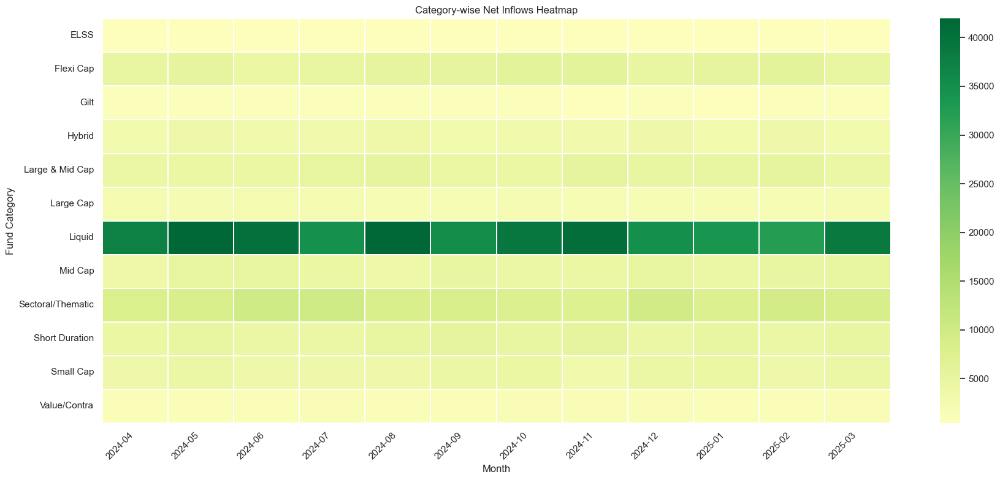

In [12]:
# =========================
# Chart 7: Category inflow heatmap
# =========================
category_pivot = category_inflows.copy()
category_pivot["month_label"] = category_pivot["month"].dt.strftime("%Y-%m")

heatmap_data = category_pivot.pivot_table(
    index="category",
    columns="month_label",
    values="net_inflow_crore",
    aggfunc="sum"
).fillna(0)

plt.figure(figsize=(18, 8))
sns.heatmap(
    heatmap_data,
    cmap="RdYlGn",
    center=0,
    linewidths=0.3,
    linecolor="white"
)
plt.title("Category-wise Net Inflows Heatmap")
plt.xlabel("Month")
plt.ylabel("Fund Category")
plt.xticks(rotation=45, ha="right")
save_matplotlib("07_category_inflow_heatmap.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/08_total_net_inflow_by_category.png


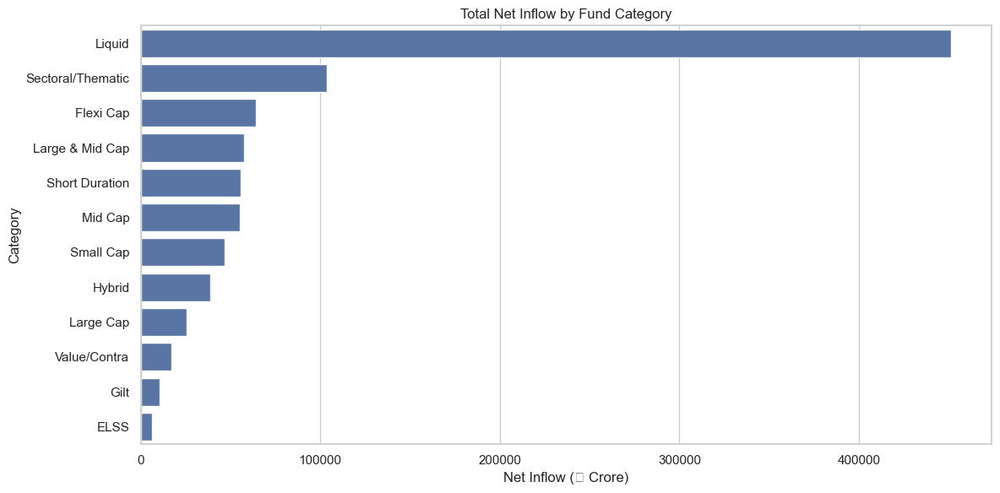

In [13]:
# =========================
# Chart 8: Top categories by total net inflow
# =========================
category_total = (
    category_inflows.groupby("category", as_index=False)["net_inflow_crore"]
    .sum()
    .sort_values("net_inflow_crore", ascending=False)
)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=category_total,
    y="category",
    x="net_inflow_crore"
)
plt.title("Total Net Inflow by Fund Category")
plt.xlabel("Net Inflow (₹ Crore)")
plt.ylabel("Category")
save_matplotlib("08_total_net_inflow_by_category.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/09_investor_age_distribution.png


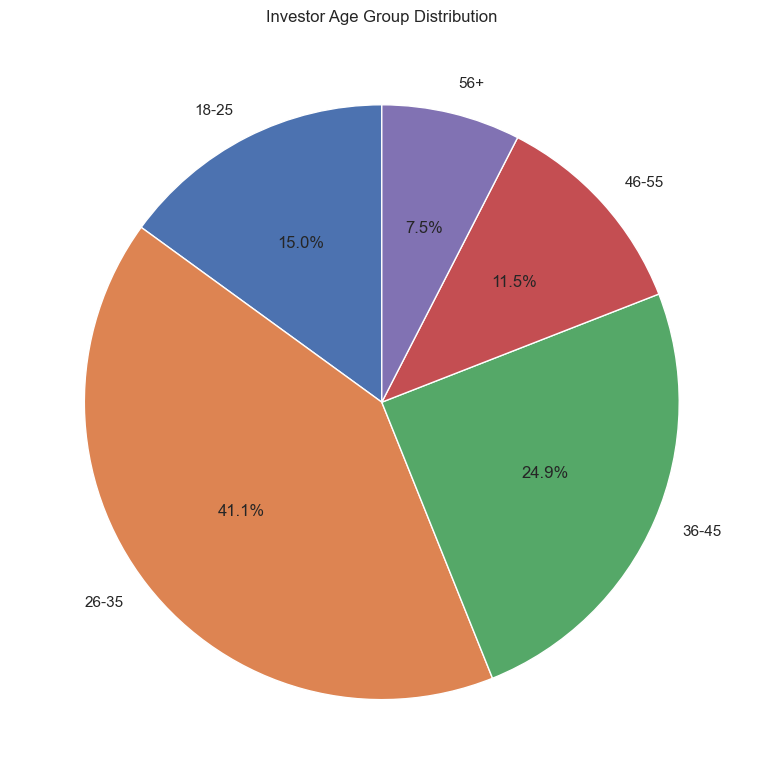

In [14]:
# =========================
# Chart 9: Age group distribution pie
# =========================
age_counts = transactions["age_group"].value_counts().sort_index()

plt.figure(figsize=(8, 8))
plt.pie(
    age_counts.values,
    labels=age_counts.index,
    autopct="%1.1f%%",
    startangle=90
)
plt.title("Investor Age Group Distribution")
save_matplotlib("09_investor_age_distribution.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/10_sip_amount_by_age_group.png


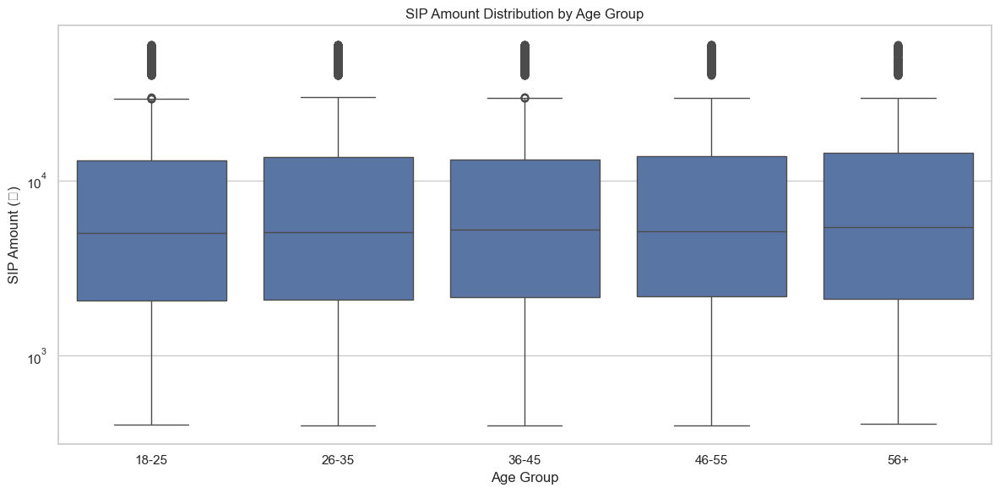

In [15]:
# =========================
# Chart 10: SIP amount boxplot by age group
# =========================
sip_tx = transactions[transactions["transaction_type"].str.lower().eq("sip")].copy()

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=sip_tx,
    x="age_group",
    y="amount",
    order=sorted(sip_tx["age_group"].dropna().unique())
)
plt.title("SIP Amount Distribution by Age Group")
plt.xlabel("Age Group")
plt.ylabel("SIP Amount (₹)")
plt.yscale("log")
save_matplotlib("10_sip_amount_by_age_group.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/11_gender_split.png


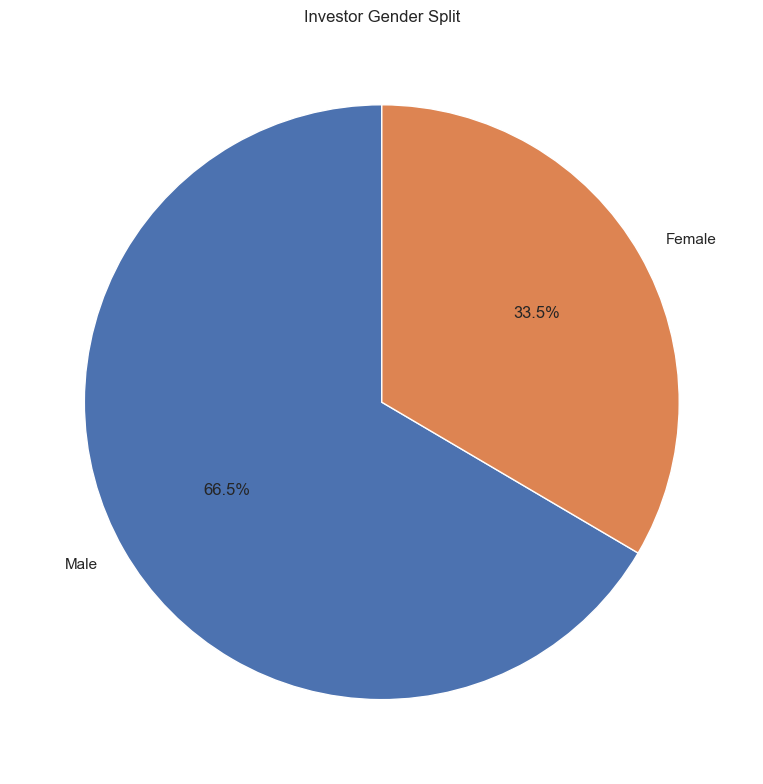

In [16]:
# =========================
# Chart 11: Gender split
# =========================
gender_counts = transactions["gender"].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(
    gender_counts.values,
    labels=gender_counts.index,
    autopct="%1.1f%%",
    startangle=90
)
plt.title("Investor Gender Split")
save_matplotlib("11_gender_split.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/12_transaction_amount_by_state.png


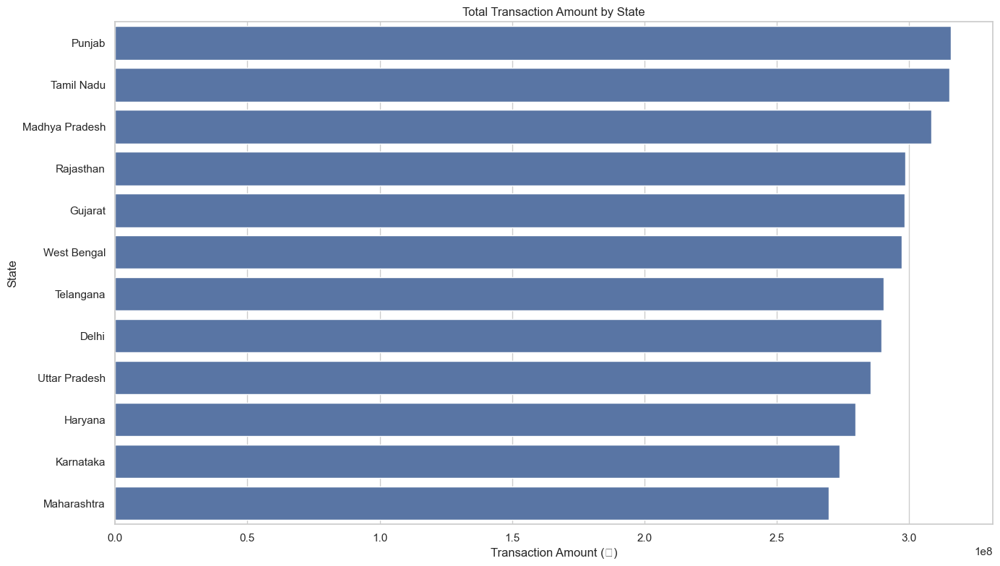

In [17]:
# =========================
# Chart 12: Transaction amount by state
# =========================
state_amount = (
    transactions.groupby("state", as_index=False)["amount"]
    .sum()
    .sort_values("amount", ascending=False)
)

plt.figure(figsize=(14, 8))
sns.barplot(
    data=state_amount,
    y="state",
    x="amount"
)
plt.title("Total Transaction Amount by State")
plt.xlabel("Transaction Amount (₹)")
plt.ylabel("State")
save_matplotlib("12_transaction_amount_by_state.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/13_city_tier_split.png


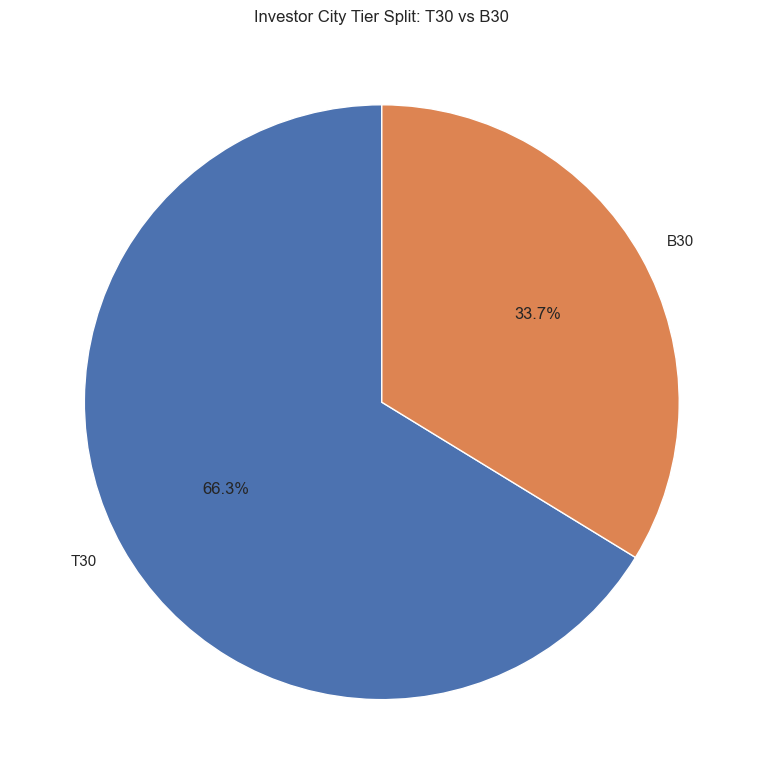

In [18]:
# =========================
# Chart 13: City tier split
# =========================
tier_counts = transactions["city_tier"].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(
    tier_counts.values,
    labels=tier_counts.index,
    autopct="%1.1f%%",
    startangle=90
)
plt.title("Investor City Tier Split: T30 vs B30")
save_matplotlib("13_city_tier_split.png")
plt.show()

In [19]:
# =========================
# Chart 14: Folio count growth
# =========================
fig = px.line(
    folio.sort_values("month"),
    x="month",
    y="total_folios_crore",
    markers=True,
    title="Mutual Fund Folio Count Growth"
)

start_row = folio.sort_values("month").iloc[0]
end_row = folio.sort_values("month").iloc[-1]

for row, label in [(start_row, "Start"), (end_row, "Latest")]:
    fig.add_annotation(
        x=row["month"],
        y=row["total_folios_crore"],
        text=f"{label}: {row['total_folios_crore']:.2f} Cr",
        showarrow=True,
        arrowhead=2,
        yshift=20
    )

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Total Folios (Crore)",
    height=550
)
fig.show()
save_plotly(fig, "14_folio_count_growth.png")

PNG export skipped for 14_folio_count_growth.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/14_folio_count_growth.html


In [20]:
# =========================
# Chart 15: Folio composition over time
# =========================
folio_long = folio.melt(
    id_vars="month",
    value_vars=[
        "equity_folios_crore",
        "debt_folios_crore",
        "hybrid_folios_crore",
        "others_folios_crore"
    ],
    var_name="folio_type",
    value_name="folios_crore"
)

fig = px.area(
    folio_long,
    x="month",
    y="folios_crore",
    color="folio_type",
    title="Folio Composition Over Time"
)

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Folios (Crore)",
    height=550
)
fig.show()
save_plotly(fig, "15_folio_composition_area.png")

PNG export skipped for 15_folio_composition_area.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/15_folio_composition_area.html


Saved: /Users/nischayaggarwal/Internship 1/reports/16_nav_return_correlation_matrix.png


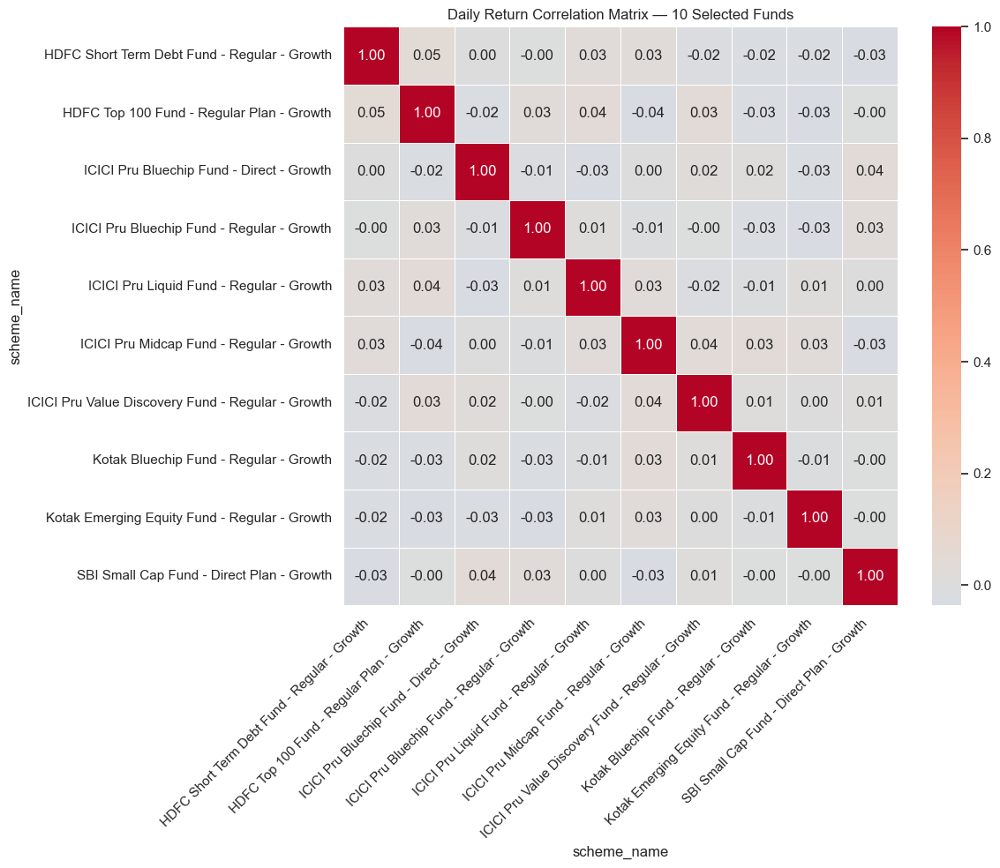

In [21]:
# =========================
# Chart 16: NAV return correlation matrix
# =========================
# Select top 10 funds by latest NAV availability
selected_codes = (
    nav.groupby("amfi_code")["date"]
    .count()
    .sort_values(ascending=False)
    .head(10)
    .index
)

nav_10 = nav[nav["amfi_code"].isin(selected_codes)].copy()
nav_returns = nav_10.sort_values(["amfi_code", "date"])
nav_returns["daily_return"] = nav_returns.groupby("amfi_code")["nav"].pct_change()

return_pivot = nav_returns.pivot_table(
    index="date",
    columns="scheme_name",
    values="daily_return"
)

corr = return_pivot.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)
plt.title("Daily Return Correlation Matrix — 10 Selected Funds")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
save_matplotlib("16_nav_return_correlation_matrix.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/17_sector_allocation_donut.png


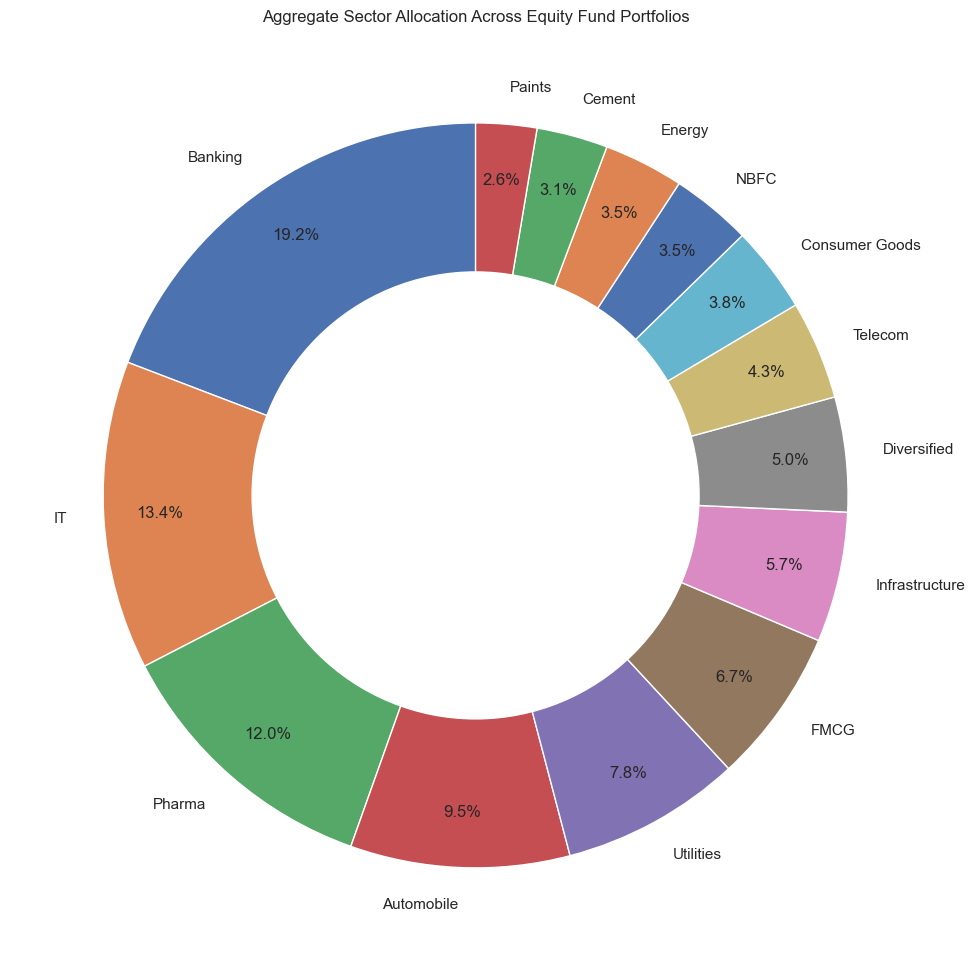

In [22]:
# =========================
# Chart 17: Sector allocation donut
# =========================
sector_alloc = (
    portfolio.groupby("sector", as_index=False)["weight_pct"]
    .sum()
    .sort_values("weight_pct", ascending=False)
)

plt.figure(figsize=(10, 10))
wedges, texts, autotexts = plt.pie(
    sector_alloc["weight_pct"],
    labels=sector_alloc["sector"],
    autopct="%1.1f%%",
    startangle=90,
    pctdistance=0.85
)
centre_circle = plt.Circle((0, 0), 0.60, fc="white")
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title("Aggregate Sector Allocation Across Equity Fund Portfolios")
save_matplotlib("17_sector_allocation_donut.png")
plt.show()

Saved: /Users/nischayaggarwal/Internship 1/reports/18_transaction_type_split.png


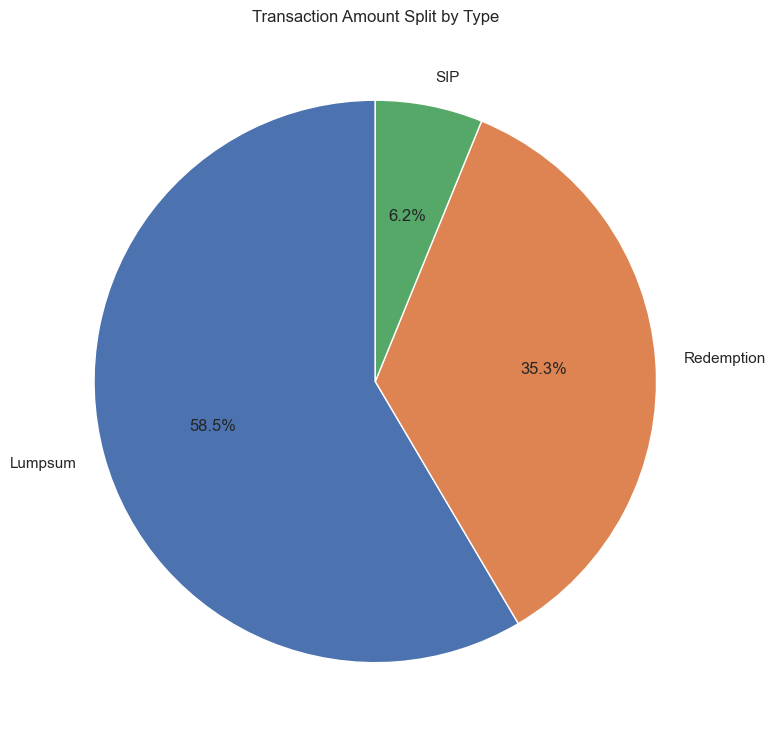

In [23]:
# =========================
# Chart 18: Transaction type split
# =========================
tx_type_amount = (
    transactions.groupby("transaction_type", as_index=False)["amount"]
    .sum()
    .sort_values("amount", ascending=False)
)

plt.figure(figsize=(8, 8))
plt.pie(
    tx_type_amount["amount"],
    labels=tx_type_amount["transaction_type"],
    autopct="%1.1f%%",
    startangle=90
)
plt.title("Transaction Amount Split by Type")
save_matplotlib("18_transaction_type_split.png")
plt.show()

In [24]:
# =========================
# Chart 19: Monthly transaction volume
# =========================
monthly_tx = (
    transactions.assign(month=transactions["date"].dt.to_period("M").dt.to_timestamp())
    .groupby("month", as_index=False)
    .agg(transaction_count=("investor_id", "count"), transaction_amount=("amount", "sum"))
)

fig = px.line(
    monthly_tx,
    x="month",
    y="transaction_count",
    markers=True,
    title="Monthly Transaction Volume"
)

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Number of Transactions",
    height=550
)
fig.show()
save_plotly(fig, "19_monthly_transaction_volume.png")

PNG export skipped for 19_monthly_transaction_volume.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/19_monthly_transaction_volume.html


In [25]:
# =========================
# Chart 20: Benchmark index trend
# =========================
fig = px.line(
    benchmark.sort_values("date"),
    x="date",
    y="close_value",
    color="index_name",
    title="Benchmark Index Trend"
)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Close Value",
    height=600
)
fig.show()
save_plotly(fig, "20_benchmark_index_trend.png")

PNG export skipped for 20_benchmark_index_trend.png. Install kaleido using: pip install -U kaleido
HTML saved instead: /Users/nischayaggarwal/Internship 1/reports/20_benchmark_index_trend.html


In [26]:
print("EDA notebook execution completed.")
print(f"Charts exported to: {CHART_DIR}")
print("Note: Plotly charts are saved as HTML by default and as PNG if kaleido is installed.")

EDA notebook execution completed.
Charts exported to: /Users/nischayaggarwal/Internship 1/reports
Note: Plotly charts are saved as HTML by default and as PNG if kaleido is installed.
